In [2]:
import glob
import os
import librosa
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import IPython.display as display
from matplotlib.pyplot import specgram
%matplotlib inline

In [3]:
# list of sound files that we will analyse
sound_file_paths = ["57320-0-0-7.wav","24074-1-0-3.wav","15564-2-0-1.wav","31323-3-0-1.wav","46669-4-0-35.wav",
"89948-5-0-0.wav","40722-8-0-4.wav","103074-7-3-2.wav","106905-8-0-0.wav","108041-9-0-4.wav"]
base_path = "UrbanSound8K/audio/fold1"
sound_file_paths = [os.path.join(base_path,fp) for fp in sound_file_paths]
sound_names = ["air conditioner","car horn","children playing","dog bark","drilling","engine idling",
"gun shot","jackhammer","siren","street music"]

In [4]:
def play_sound_files(file_paths):
    for fp in file_paths:
        print fp
        raw_sound, sampling_rate = librosa.load(fp)
        display.display(display.Audio(data=raw_sound, rate=sampling_rate))

In [5]:
play_sound_files(sound_file_paths)

UrbanSound8K/audio/fold1/57320-0-0-7.wav


UrbanSound8K/audio/fold1/24074-1-0-3.wav


UrbanSound8K/audio/fold1/15564-2-0-1.wav


UrbanSound8K/audio/fold1/31323-3-0-1.wav


UrbanSound8K/audio/fold1/46669-4-0-35.wav


UrbanSound8K/audio/fold1/89948-5-0-0.wav


UrbanSound8K/audio/fold1/40722-8-0-4.wav


UrbanSound8K/audio/fold1/103074-7-3-2.wav


UrbanSound8K/audio/fold1/106905-8-0-0.wav


UrbanSound8K/audio/fold1/108041-9-0-4.wav


In [6]:
def load_sound_files(file_paths):
    '''
    uses librosa.load() to load list of audio files given in file_paths
    returns list of raw sounds
    '''
    raw_sounds = []
    for fp in file_paths:
        raw_sound, sampling_rate = librosa.load(fp)
        raw_sounds.append(raw_sound)
    return raw_sounds

In [7]:
# Now lets load all our sound files
raw_sounds = load_sound_files(sound_file_paths)

In [8]:
def plot_waves(sound_names,raw_sounds):
    '''
    Plots the waveforms for given list of sounds and sound names
    '''
    i = 1
    length = len(raw_sounds)
    fig = plt.figure(figsize=(25,60), dpi = 900)
    for name,sound in zip(sound_names,raw_sounds):
        plt.subplot(length,1,i)
        librosa.display.waveplot(np.array(sound),sr=22050)
        plt.title(name)
        i += 1
    plt.suptitle('Figure 1: Waveplot',x=0.5, y=0.915,fontsize=18)
    plt.show()

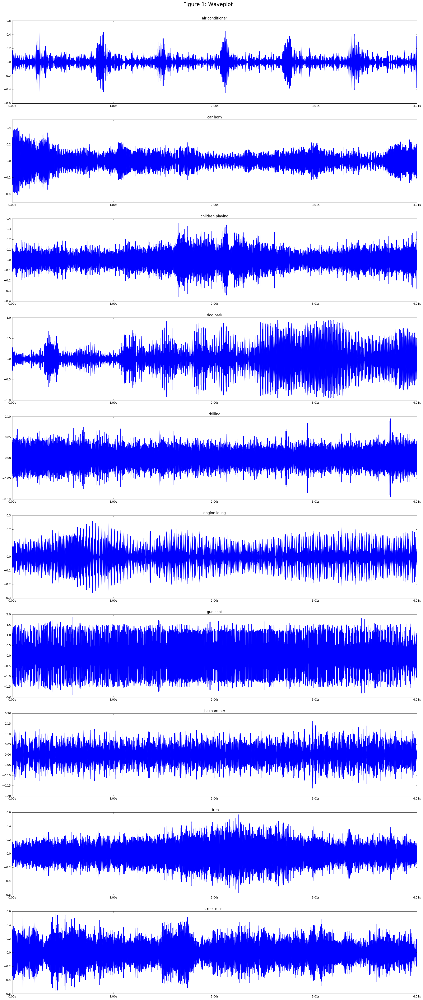

In [9]:
plot_waves(sound_names,raw_sounds)

In [13]:
def plot_specgram(sound_names,raw_sounds):
    i = 1
    length = len(raw_sounds)
    fig = plt.figure(figsize=(25,60), dpi = 900)
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(length,1,i)
        specgram(np.array(f), Fs=22050)
        plt.title(n.title())
        i += 1
    plt.suptitle('Figure 2: Spectrogram',x=0.5, y=0.915,fontsize=18)
    plt.show()

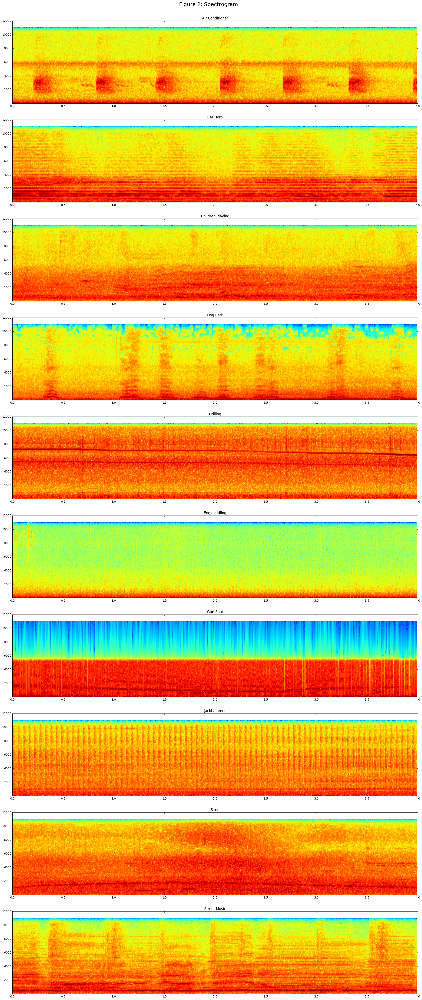

In [14]:
plot_specgram(sound_names, raw_sounds)

In [15]:
def plot_log_power_specgram(sound_names,raw_sounds):
    i = 1
    length = len(raw_sounds)
    fig = plt.figure(figsize=(25,60), dpi = 900)
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(length,1,i)
        D = librosa.logamplitude(np.abs(librosa.stft(f))**2, ref_power=np.max)
        librosa.display.specshow(D,x_axis='time' ,y_axis='log')
        plt.title(n.title())
        i += 1
    plt.suptitle('Figure 3: Log power spectrogram',x=0.5, y=0.915,fontsize=18)
    plt.show()

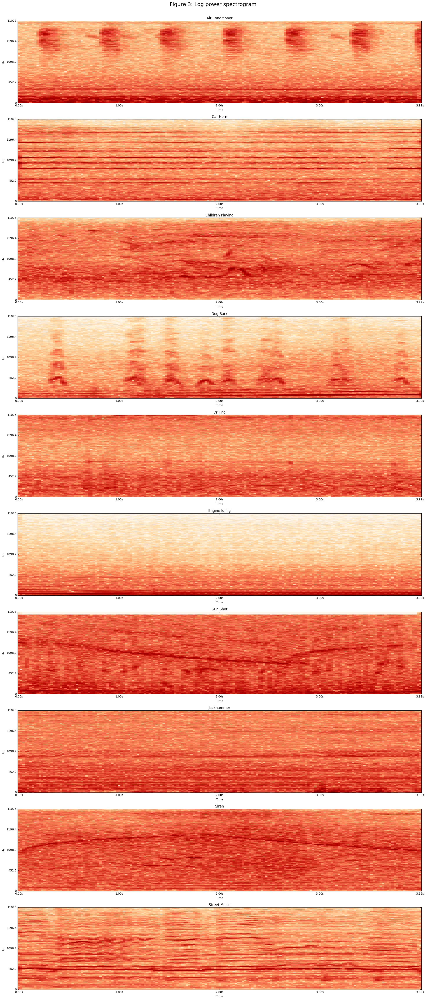

In [16]:
plot_log_power_specgram(sound_names, raw_sounds)

## Feature Extraction

* melspectrogram: Compute a Mel-scaled power spectrogram
* mfcc: Mel-frequency cepstral coefficients
* chorma-stft: Compute a chromagram from a waveform or power spectrogram
* spectral_contrast: Compute spectral contrast, using method defined in [1]
* tonnetz: Computes the tonal centroid features (tonnetz), following the method of [2]  
[1] http://ieeexplore.ieee.org/xpls/abs_all.jsp?arnumber=1035731  
[2] http://dl.acm.org/citation.cfm?id=1178727

In [18]:
def extract_feature(file_name):
    '''
    returns a 5 tuple of features extracted from the audio file passed as file_name
    '''
    X, sample_rate = librosa.load(file_name)
    stft = np.abs(librosa.stft(X))
    mfccs = np.mean(librosa.feature.mfcc(y=X, sr=sample_rate, n_mfcc=40).T,axis=0)
    chroma = np.mean(librosa.feature.chroma_stft(S=stft, sr=sample_rate).T,axis=0)
    mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
    contrast = np.mean(librosa.feature.spectral_contrast(S=stft, sr=sample_rate).T,axis=0)
    tonnetz = np.mean(librosa.feature.tonnetz(y=librosa.effects.harmonic(X), sr=sample_rate).T,axis=0)
    return mfccs,chroma,mel,contrast,tonnetz

In [22]:
def parse_audio_files(parent_dir,sub_dirs,file_ext='*.wav'):
    features, labels = np.empty((0,193)), np.empty(0)
    for label, sub_dir in enumerate(sub_dirs):
        for fn in glob.glob(os.path.join(parent_dir, sub_dir, file_ext)):
            mfccs, chroma, mel, contrast,tonnetz = extract_feature(fn)
            ext_features = np.hstack([mfccs,chroma,mel,contrast,tonnetz])
            features = np.vstack([features,ext_features])
            labels = np.append(labels, fn.split('/')[-1].split('-')[1])
    return np.array(features), np.array(labels, dtype = np.int)

In [23]:
def one_hot_encode(labels):
    n_labels = len(labels)
    n_unique_labels = len(np.unique(labels))
    one_hot_encode = np.zeros((n_labels,n_unique_labels))
    one_hot_encode[np.arange(n_labels), labels] = 1
    return one_hot_encode

In [24]:
parent_dir = 'UrbanSound8K/audio'
tr_sub_dirs = ['fold1','fold2']
ts_sub_dirs = ['fold3']
tr_features, tr_labels = parse_audio_files(parent_dir,tr_sub_dirs)
ts_features, ts_labels = parse_audio_files(parent_dir,ts_sub_dirs)

tr_labels = one_hot_encode(tr_labels)
ts_labels = one_hot_encode(ts_labels)

/home/luthrak/Projects/MIR/tf/local/lib/python2.7/site-packages/librosa/core/pitch.py:148: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')
/home/luthrak/Projects/MIR/tf/local/lib/python2.7/site-packages/librosa/util/utils.py:1478: RuntimeWarning: invalid value encountered in divide
  mask /= mask + (X_ref / Z)**power


KeyboardInterrupt: 

## Learning Configuration

In [28]:
training_epochs = 50
n_dim = tr_features.shape[1]
n_classes = 10
n_hidden_units_one = 280 
n_hidden_units_two = 300
sd = 1 / np.sqrt(n_dim)
learning_rate = 0.01

In [29]:
X = tf.placeholder(tf.float32,[None,n_dim])
Y = tf.placeholder(tf.float32,[None,n_classes])

W_1 = tf.Variable(tf.random_normal([n_dim,n_hidden_units_one], mean = 0, stddev=sd))
b_1 = tf.Variable(tf.random_normal([n_hidden_units_one], mean = 0, stddev=sd))
h_1 = tf.nn.tanh(tf.matmul(X,W_1) + b_1)


W_2 = tf.Variable(tf.random_normal([n_hidden_units_one,n_hidden_units_two], mean = 0, stddev=sd))
b_2 = tf.Variable(tf.random_normal([n_hidden_units_two], mean = 0, stddev=sd))
h_2 = tf.nn.sigmoid(tf.matmul(h_1,W_2) + b_2)


W = tf.Variable(tf.random_normal([n_hidden_units_two,n_classes], mean = 0, stddev=sd))
b = tf.Variable(tf.random_normal([n_classes], mean = 0, stddev=sd))
y_ = tf.nn.softmax(tf.matmul(h_2,W) + b)

init = tf.initialize_all_variables()

In [30]:
cost_function = tf.reduce_mean(-tf.reduce_sum(Y * tf.log(y_), reduction_indices=[1])) 
optimizer = tf.train.GradientDescentOptimizer(learning_rate).minimize(cost_function)

correct_prediction = tf.equal(tf.argmax(y_,1), tf.argmax(Y,1))
accuracy = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))

In [31]:
cost_history = np.empty(shape=[1],dtype=float)
y_true, y_pred = None, None
with tf.Session() as sess:
    sess.run(init)
    for epoch in range(training_epochs):            
        _,cost = sess.run([optimizer,cost_function],feed_dict={X:tr_features,Y:tr_labels})
        cost_history = np.append(cost_history,cost)
    
    y_pred = sess.run(tf.argmax(y_,1),feed_dict={X: ts_features})
    y_true = sess.run(tf.argmax(ts_labels,1))
    print('Test accuracy: ',round(session.run(accuracy, feed_dict={X: ts_features, Y: ts_labels}) , 3))

fig = plt.figure(figsize=(10,8))
plt.plot(cost_history)
plt.axis([0,training_epochs,0,np.max(cost_history)])
plt.show()

p,r,f,s = precision_recall_fscore_support(y_true, y_pred, average='micro')
print "F-Score:", round(f,3)

ValueError: Cannot feed value of shape (1761,) for Tensor u'Placeholder_3:0', which has shape '(?, 10)'